In [153]:
import string
import numpy as np
import tensorflow as tf
from PIL import Image
import argparse
import os
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt
import pickle
from pickle import dump, load
import numpy as np
from keras.utils import plot_model
from keras.applications.xception import Xception, preprocess_input
from tensorflow.keras.utils import img_to_array , load_img
from keras.preprocessing.text import Tokenizer
from tensorflow.keras.utils import pad_sequences
from keras.utils import to_categorical
from tensorflow.keras.layers import concatenate
from keras.models import Model, load_model
from keras.layers import Input, Dense, LSTM, Embedding, Dropout


In [33]:
def load_document(filename):
  file = open(filename,'r')
  data = file.read()
  file.close()
  return data

In [96]:
def load_image_captions(filename):
  file = load_document(filename)
  img_captions = file.split('\n')
  del img_captions[0]
  descriptions = {}
  rearranged = []

  for img_caption in img_captions[:-1]:
    index = img_caption.find(',')
    img_caption = img_caption[:index] + "\t" + img_caption[index+1:] 
    rearranged.append(img_caption)
  img_captions = rearranged
  
  for img_caption in img_captions:
    image , caption = img_caption.split('\t')
    if image not in descriptions:
      descriptions[image] = [caption]
    else:
      descriptions[image].append(caption)
  return descriptions

In [97]:
def cleaning_captions(captions):
  table = str.maketrans('','',string.punctuation)
  for image,img_captions in captions.items():
    for index, image_caption in enumerate(img_captions):
      image_caption.replace("-","")
      caption_words = image_caption.split()
      caption_words = [word.lower() for word in caption_words]
      caption_words = [word.translate(table) for word in caption_words]
      caption_words = [word for word in caption_words if len(word)>1]
      caption_words = [word for word in caption_words if word.isalpha()]
      image_caption = ' '.join(caption_words)
      captions[image][index] = image_caption
  return captions

In [98]:
def vocabulary(image_captions):
  vocabulary = set()
  for image in image_captions.keys():
    [vocabulary.update(caption.split()) for caption in image_captions[image]]
  return vocabulary

In [99]:
def save_to_file(image_captions,filename):
  image_captions_list = list()
  for image,captions in image_captions.items():
    for caption in captions:
      image_captions_list.append(image + '\t' + caption)
  data = "\n".join(image_captions_list)
  file = open(filename,'w')
  file.write(data)
  file.close()

In [101]:
filename = "/content/captions.txt"
image_caption = load_image_captions(filename)
image_caption
image_captions = cleaning_captions(image_caption)
language_vocabulary = vocabulary(image_captions)
save_to_file(image_captions,'image_captions.txt')

In [102]:
def extract_features(file_location):
  model = Xception(include_top = False,pooling = 'avg')
  features = {}
  for image in os.listdir(file_location):
    img = file_location + '/' + image 
    img = Image.open(img)
    img = img.resize((299,299))
    img = np.expand_dims(img, axis=0)
    img = img/127.5
    img = img - 1.0
    
    feature = model.predict(img)
    features[image] = feature
  return features
      

file_location = "/content/Flicker8k_Dataset"
features = extract_features(file_location)

Streaming output truncated to the last 5000 lines.
1/1 [==============================] - 0s 42ms/step


In [103]:
dump(features,open("Imagefeatures.p","wb"))
len(features)

8091

In [104]:
features

{'3744832122_2f4febdff6.jpg': array([[0.        , 0.        , 0.00385938, ..., 0.7843328 , 0.        ,
         0.14617293]], dtype=float32),
 '379006645_b9a2886b51.jpg': array([[0.00097198, 0.00336388, 0.        , ..., 0.        , 0.        ,
         0.        ]], dtype=float32),
 '2223382277_9efa58ec45.jpg': array([[0.06210203, 0.0175156 , 0.        , ..., 0.        , 0.        ,
         0.        ]], dtype=float32),
 '1056873310_49c665eb22.jpg': array([[0.00000000e+00, 1.27293775e-02, 7.52818137e-02, ...,
         4.96360600e-01, 1.87474936e-01, 4.35775524e-04]], dtype=float32),
 '3607405494_0df89110a6.jpg': array([[0.00051258, 0.02952127, 0.32711738, ..., 0.01047808, 0.42225263,
         0.        ]], dtype=float32),
 '516761840_842dabc908.jpg': array([[0.01263999, 0.1964805 , 0.00987823, ..., 0.01921119, 0.0135264 ,
         0.42408606]], dtype=float32),
 '2084103826_ffd76b1e3e.jpg': array([[0.01341507, 0.17707206, 0.07175384, ..., 0.27834103, 0.06267467,
         0.14557716]], 

In [105]:
def load_imgNames(description):
    return list(description.keys())

In [106]:
def load_clean_captions(filename,imgNames):
    imgCaptions = load_document(filename)
    imgCaptions = imgCaptions.split('\n')
    descriptions = {}
    for imgCaption in imgCaptions:
        words = imgCaption.split()
        if len(words) < 1:
            continue
        
        imgName = words[0]
        imgCap = words[1:]
        
        if imgName in imgNames:
            if imgName not in descriptions:
                descriptions[imgName] = []
            
            imgCap = "<start> " + " ".join(imgCap) + " <end>"
            descriptions[imgName].append(imgCap)
    
    return descriptions
    

In [107]:
def load_imgFeatures(imgNames):
  img_features = load(open('Imagefeatures.p','rb'))
  features = {k:img_features[k] for k in imgNames}

In [108]:
imgNames = load_imgNames(image_caption)[:-1]
clean_ImgCaptions = load_clean_captions('/content/image_captions.txt',imgNames)
load_imgFeatures(imgNames)

In [109]:
def list_captions(imgCaptions):
    imgNames = imgCaptions.keys()
    captions_list = []
    for imgName in imgNames:
        [captions_list.append(imgCaption) for imgCaption in imgCaptions[imgName]]
    return captions_list

In [110]:
def create_Tokenizer(imgCaptions):
    captions_list = list_captions(imgCaptions)
    tokenizer = Tokenizer()
    tokenizer.fit_on_texts(captions_list)
    return tokenizer

In [111]:
tokenizer = create_Tokenizer(clean_ImgCaptions)
dump(tokenizer,open('tokens.p','wb'))
vocabulary_size = len(tokenizer.word_index) + 1

In [112]:
vocabulary_size

8764

In [113]:
def max_length(imgCaptions):
    captions_list = list_captions(imgCaptions)
    return max(len(imgCaption.split()) for imgCaption in captions_list)

maxlength = max_length(image_caption)
maxlength

32

In [114]:
vocabulary_size

8764

In [115]:
def create_sequences(tokenizer, max_length, img_captions, feature):
    X1, X2, y = list(), list(), list()
    for img_caption in img_captions:
        
        seq = tokenizer.texts_to_sequences([img_caption])[0]
        for i in range(1, len(seq)):
            in_seq, out_seq = seq[:i], seq[i]
            in_seq = pad_sequences([in_seq], maxlen=max_length)[0]
            out_seq = to_categorical([out_seq], num_classes=vocabulary_size)[0]
            
            X1.append(feature)
            X2.append(in_seq)
            y.append(out_seq)
    return np.array(X1), np.array(X2), np.array(y)

def data_generator(imgCaptions, features, tokenizer, max_length):
    while 1:
        for key, img_captions in imgCaptions.items():
            feature = features[key][0]
            input_image, input_sequence, output_word = create_sequences(tokenizer, max_length, img_captions, feature)
            yield [[input_image, input_sequence], output_word]

In [116]:
[a,b],c = next(data_generator(clean_ImgCaptions, features, tokenizer, maxlength))
a.shape, b.shape, c.shape

((47, 2048), (47, 32), (47, 8764))

In [156]:
def define_model(vocabulary_size, max_length):
    inputs1 = Input(shape=(2048,))
    fe1 = Dropout(0.5)(inputs1)
    fe2 = Dense(256, activation='relu')(fe1)
    fe3 = Dense(128, activation='relu')(fe2)
    fe4 = Dense(64, activation='relu')(fe3)

    inputs2 = Input(shape=(max_length,))
    se1 = Embedding(vocabulary_size, 256, mask_zero=True)(inputs2)
    se2 = Dropout(0.4)(se1)
    se3 = LSTM(256)(se2)
    decoder1 = concatenate([fe4, se3])
    decoder2 = Dense(256, activation='relu')(decoder1)
    decoder3 = Dense(128, activation='relu')(decoder2)
    decoder4 = Dense(64, activation='relu')(decoder3)
    outputs = Dense(vocabulary_size, activation='softmax')(decoder4)
    model = Model(inputs=[inputs1, inputs2], outputs=outputs)
    model.compile(loss='categorical_crossentropy', optimizer=Adam(lr = 0.002))
    print(model.summary())
    plot_model(model, to_file='model.png', show_shapes=True)
    return model

In [ ]:
model = define_model(vocabulary_size, maxlength)
epochs = 50
steps = len(clean_ImgCaptions)
for i in range(epochs):
    generator = data_generator(clean_ImgCaptions, features, tokenizer, maxlength)
    model.fit(generator, epochs=1, steps_per_epoch= steps, verbose=1)

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_13 (InputLayer)          [(None, 2048)]       0           []                               
                                                                                                  
 dropout_8 (Dropout)            (None, 2048)         0           ['input_13[0][0]']               
                                                                                                  
 input_14 (InputLayer)          [(None, 32)]         0           []                               
                                                                                                  
 dense_14 (Dense)               (None, 256)          524544      ['dropout_8[0][0]']              
                                                                                            

/usr/local/lib/python3.8/dist-packages/keras/optimizers/optimizer_v2/adam.py:110: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


None
2169/8090 [=======>......................] - ETA: 9:57 - loss: 5.1395

In [121]:
def word_for_id(integer, tokenizer):
  for word, index in tokenizer.word_index.items():
     if index == integer:
         return word
  return None

In [122]:
def generate_desc(model, tokenizer, photo, max_length):
    in_text = 'start'
    for i in range(max_length):
        sequence = tokenizer.texts_to_sequences([in_text])[0]
        sequence = pad_sequences([sequence], maxlen=max_length)
        pred = model.predict([photo,sequence], verbose=0)
        pred = np.argmax(pred)
        word = word_for_id(pred, tokenizer)
        if word is None:
            break
        in_text += ' ' + word
        if word == 'end':
            break
    return in_text

In [125]:
tokenizer = load(open("tokens.p","rb"))

In [129]:
def extract_features(filename, model):
        try:
            image = Image.open(filename)
        except:
            print("ERROR: Couldn't open image! Make sure the image path and extension is correct")
        image = image.resize((299,299))
        image = np.array(image)
        # for images that has 4 channels, we convert them into 3 channels
        if image.shape[2] == 4: 
            image = image[..., :3]
        image = np.expand_dims(image, axis=0)
        image = image/127.5
        image = image - 1.0
        feature = model.predict(image)
        return feature

In [130]:
xception_model = Xception(include_top=False, pooling="avg")

1/1 [==============================] - 0s 20ms/step


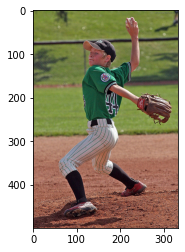

start baseball player in white shirt is playing baseball end
1/1 [==============================] - 0s 20ms/step


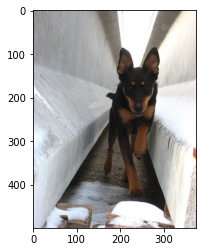

start dog is running through the grass end
1/1 [==============================] - 0s 20ms/step


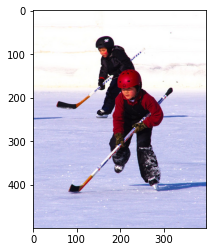

start two people are playing hockey on frozen day end
1/1 [==============================] - 0s 20ms/step


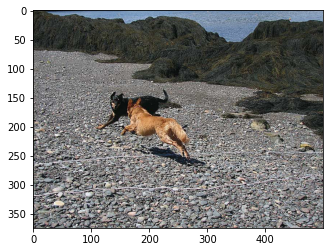

start dog is running through the grass end
1/1 [==============================] - 0s 20ms/step


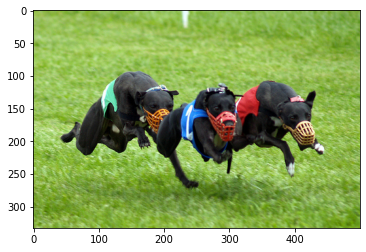

start two dogs are running through the grass end
1/1 [==============================] - 0s 20ms/step


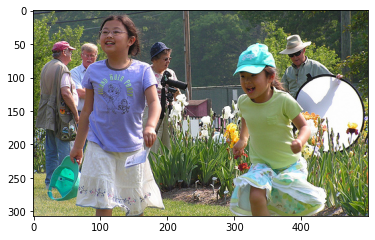

start two children are playing in the grass end
1/1 [==============================] - 0s 27ms/step


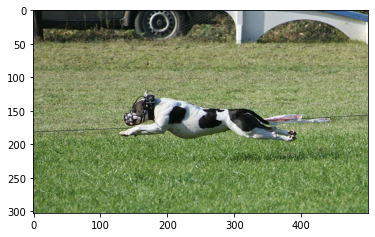

start black and white dog is running through the grass end
1/1 [==============================] - 0s 20ms/step


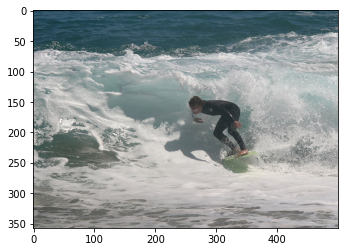

start man in black and white wetsuit is standing on the beach end
1/1 [==============================] - 0s 22ms/step


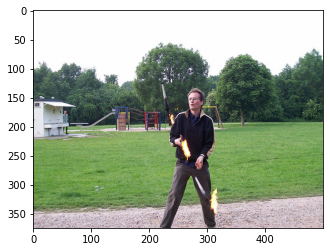

start two children are playing in the grass end
1/1 [==============================] - 0s 20ms/step


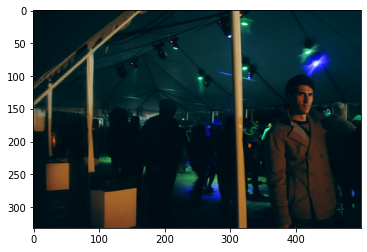

start man in red shirt is standing in front of building end
1/1 [==============================] - 0s 20ms/step


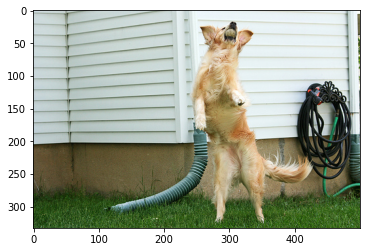

start dog is running through the grass end
1/1 [==============================] - 0s 21ms/step


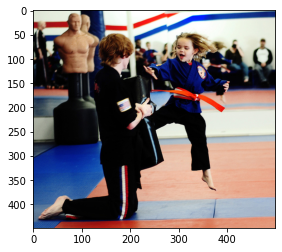

start man in red shirt is standing in front of building end
1/1 [==============================] - 0s 20ms/step


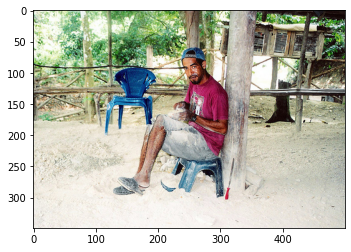

start man in red shirt is standing in front of building end
1/1 [==============================] - 0s 21ms/step


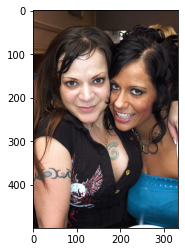

start two girls are sitting on the floor and look at the camera end
1/1 [==============================] - 0s 22ms/step


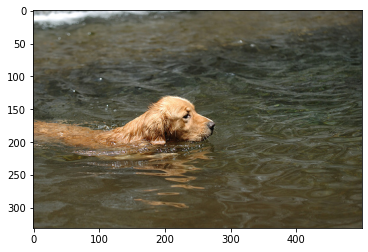

start dog is running through the water end
1/1 [==============================] - 0s 24ms/step


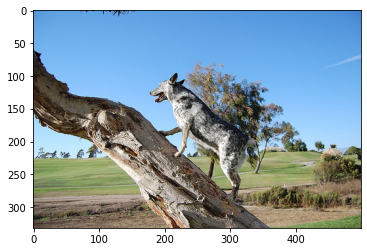

start dog is running through the grass end
1/1 [==============================] - 0s 20ms/step


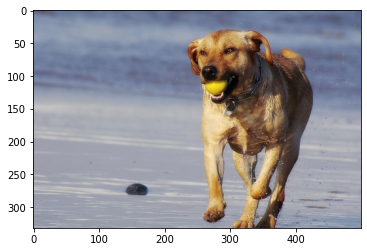

start brown dog is running through the water end
1/1 [==============================] - 0s 23ms/step


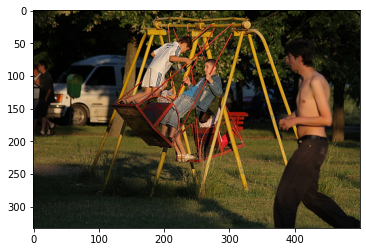

start girl in red shirt is swinging on swing end
1/1 [==============================] - 0s 25ms/step


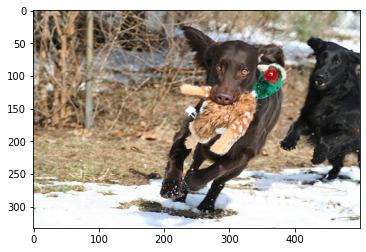

start black dog is running through the snow end
1/1 [==============================] - 0s 25ms/step


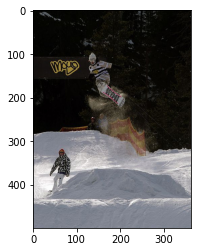

start child in red jacket is walking through the snow end
1/1 [==============================] - 0s 25ms/step


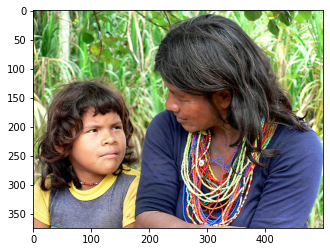

start two girls are sitting on bench end
1/1 [==============================] - 0s 23ms/step


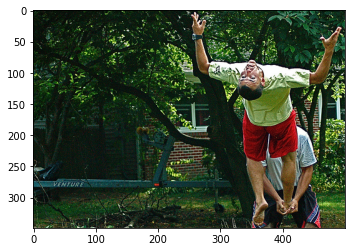

start two children are playing in the grass end
1/1 [==============================] - 0s 31ms/step


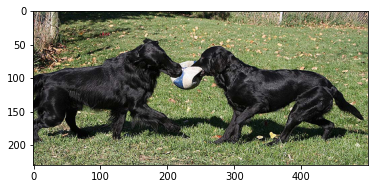

start black dog is running through the grass end
1/1 [==============================] - 0s 25ms/step


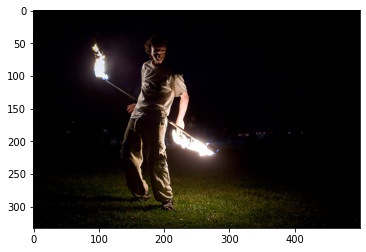

start two children are playing in water end
1/1 [==============================] - 0s 25ms/step


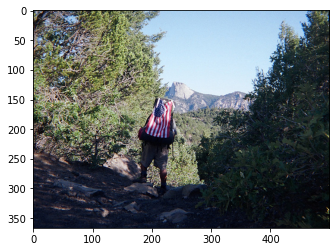

start man is climbing up sheer cliff face end
1/1 [==============================] - 0s 27ms/step


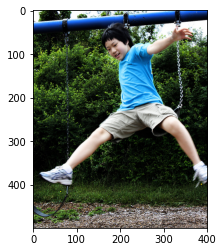

start girl in red shirt is swinging on swing end
1/1 [==============================] - 0s 27ms/step


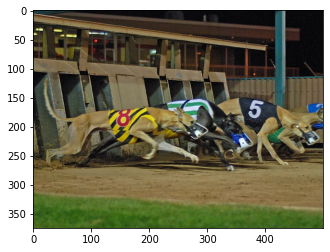

start two dogs are racing on track end
1/1 [==============================] - 0s 29ms/step


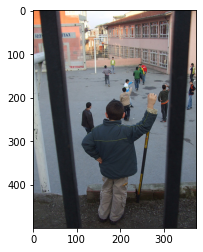

start two children are playing in the grass end
1/1 [==============================] - 0s 30ms/step


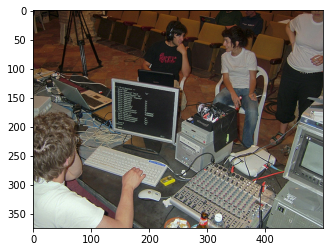

start man in red shirt and black shorts is standing in front of building end
1/1 [==============================] - 0s 32ms/step


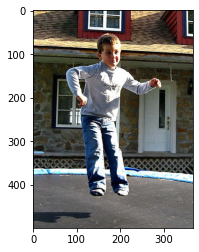

start man in red shirt is standing on the grass with her arms outstretched end
1/1 [==============================] - 0s 19ms/step


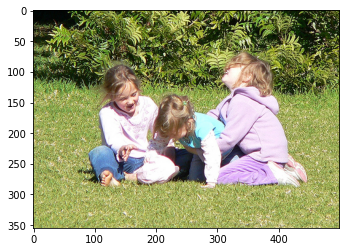

start little boy in red shirt is playing with water end
1/1 [==============================] - 0s 21ms/step


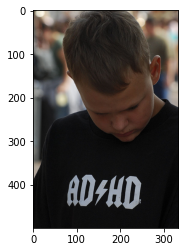

start man in red shirt is standing in front of building end
1/1 [==============================] - 0s 27ms/step


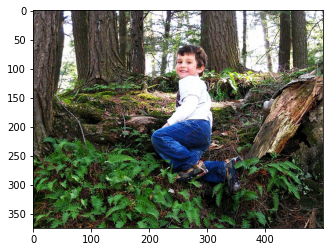

start two girls are playing on the grass end
1/1 [==============================] - 0s 28ms/step


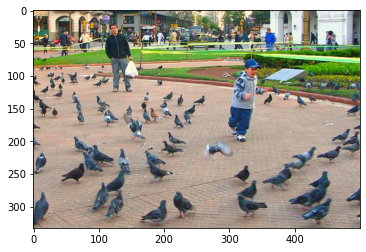

start man in red shirt is walking with her black dog end
1/1 [==============================] - 0s 31ms/step


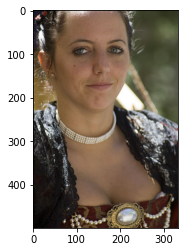

start man in red shirt is standing in front of building end
1/1 [==============================] - 0s 29ms/step


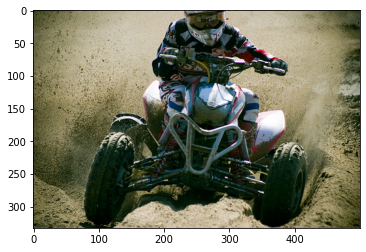

start man rides motorbike down the street end
1/1 [==============================] - 0s 30ms/step


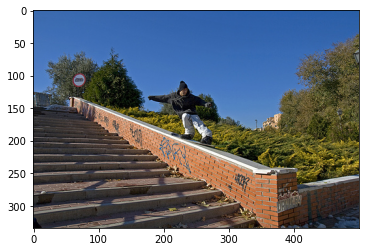

start man in red shirt is standing on the edge of the water end
1/1 [==============================] - 0s 31ms/step


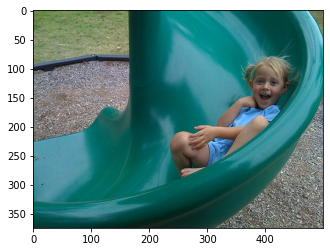

start little boy is sliding down the slide end
1/1 [==============================] - 0s 28ms/step


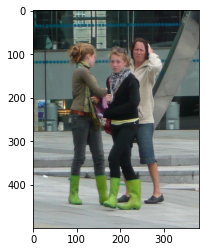

start man in red shirt is standing in front of building end
1/1 [==============================] - 0s 30ms/step


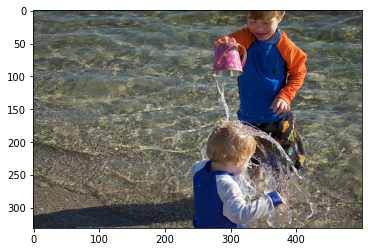

start two children are playing in water end
1/1 [==============================] - 0s 31ms/step


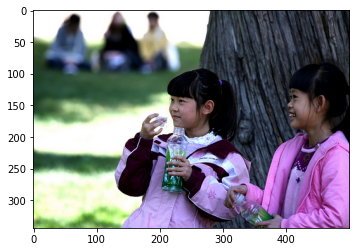

start two girls are sitting on bench in front of building end
1/1 [==============================] - 0s 44ms/step


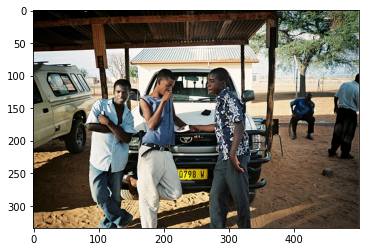

start man in red shirt is standing in front of building end
1/1 [==============================] - 0s 31ms/step


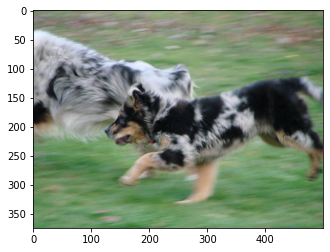

start black and white dog is running through the grass end
1/1 [==============================] - 0s 31ms/step


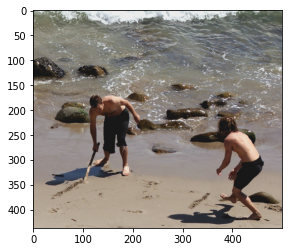

start man in red shirt is walking on the beach end
1/1 [==============================] - 0s 34ms/step


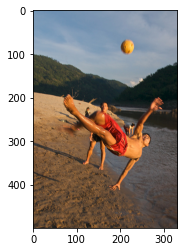

start two boys are playing with soccer ball on the beach end
1/1 [==============================] - 0s 36ms/step


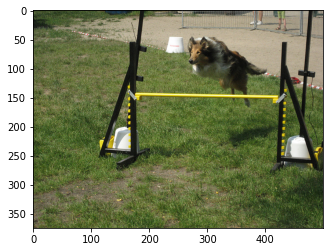

start dog is jumping over hurdle end
1/1 [==============================] - 0s 30ms/step


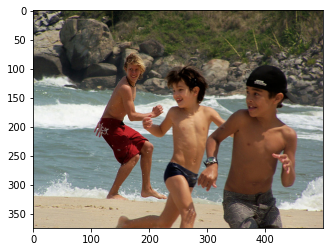

start two girls are playing in the water end
1/1 [==============================] - 0s 31ms/step


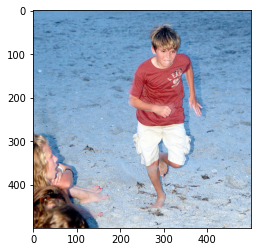

start two children are playing in the grass end
1/1 [==============================] - 0s 28ms/step


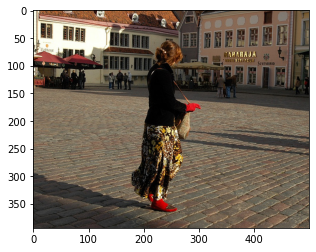

start man in red shirt is standing in front of building end
1/1 [==============================] - 0s 39ms/step


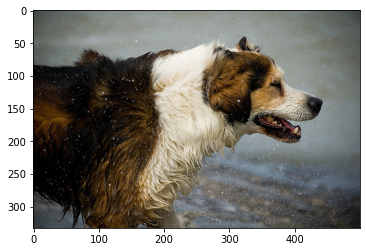

start dog is running through the water end
1/1 [==============================] - 0s 30ms/step


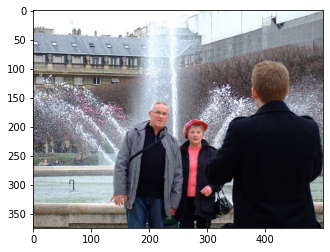

start man in red shirt is walking with her black dog end
1/1 [==============================] - 0s 32ms/step


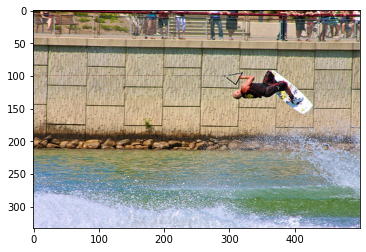

start man is surfing on the beach end
1/1 [==============================] - 0s 27ms/step


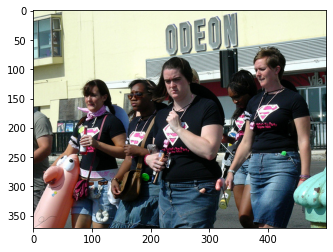

start man in black shirt and black shirt is standing in front of building end
1/1 [==============================] - 0s 29ms/step


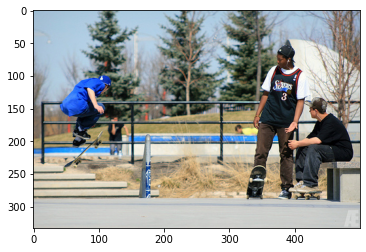

start man in red shirt is standing on the grass end
1/1 [==============================] - 0s 30ms/step


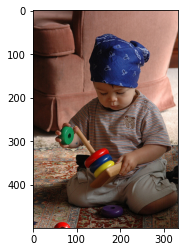

start two children are playing in the grass end
1/1 [==============================] - 0s 30ms/step


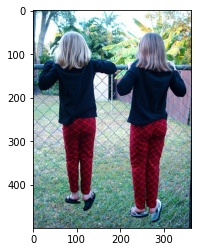

start two children are playing on the grass end
1/1 [==============================] - 0s 33ms/step


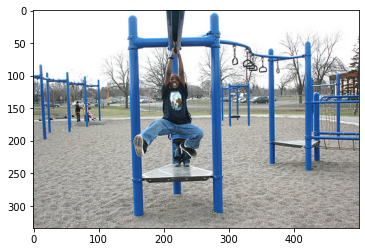

start girl in pink shirt is swinging on swing end
1/1 [==============================] - 0s 30ms/step


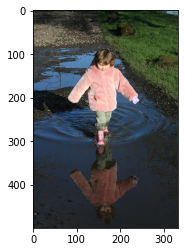

start man in black shirt is walking dog on the beach end
1/1 [==============================] - 0s 29ms/step


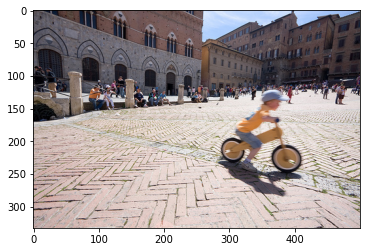

start boy in red shirt is riding unicycle down the street end
1/1 [==============================] - 0s 36ms/step


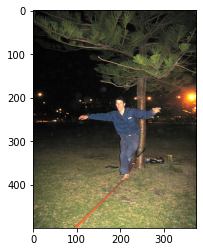

start two children are playing in the grass end
1/1 [==============================] - 0s 32ms/step


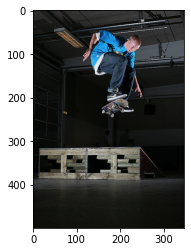

start skateboarder is jumping over the stairs end
1/1 [==============================] - 0s 37ms/step


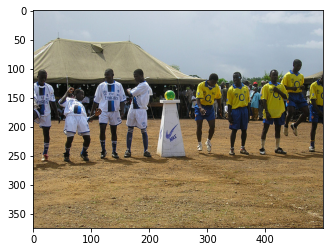

start man in black shirt and black shorts is standing in front of the water end
1/1 [==============================] - 0s 28ms/step


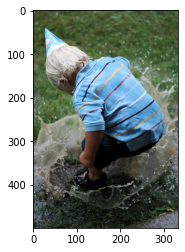

start two children are playing in water end
1/1 [==============================] - 0s 29ms/step


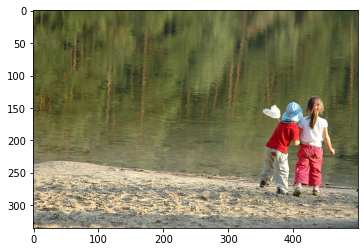

start two boys are playing in the water end
1/1 [==============================] - 0s 29ms/step


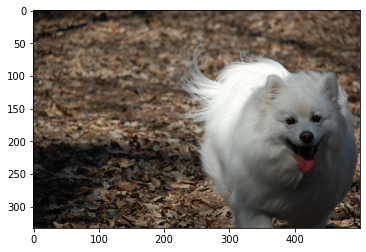

start white dog is running through the grass end
1/1 [==============================] - 0s 30ms/step


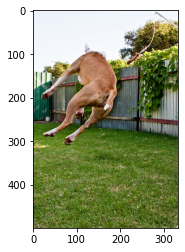

start dog is running through the grass end
1/1 [==============================] - 0s 30ms/step


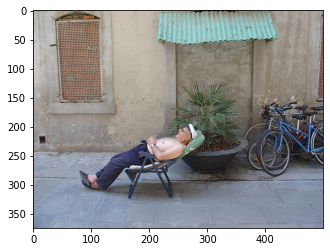

start man in red shirt is standing in front of building end
1/1 [==============================] - 0s 31ms/step


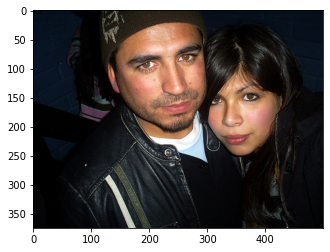

start man in black shirt and blue shorts is standing in front of building end
1/1 [==============================] - 0s 32ms/step


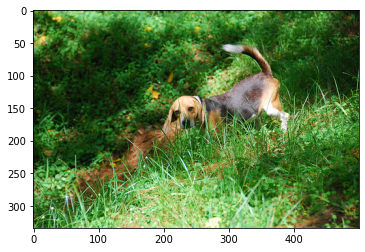

start dog is running through the grass end
1/1 [==============================] - 0s 32ms/step


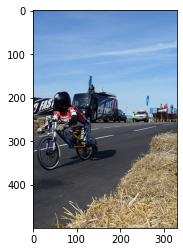

start man rides bike down the street end
1/1 [==============================] - 0s 30ms/step


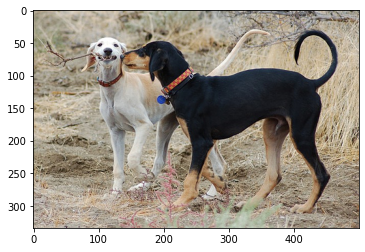

start dog is running through the grass end
1/1 [==============================] - 0s 29ms/step


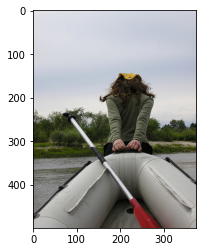

start man in black shorts is walking on the beach end
1/1 [==============================] - 0s 28ms/step


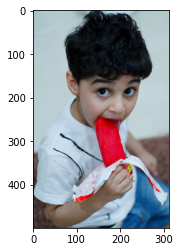

start two children are playing in water end
1/1 [==============================] - 0s 28ms/step


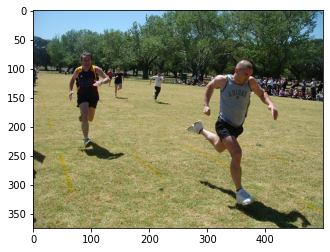

start two boys are playing soccer on the grass end
1/1 [==============================] - 0s 43ms/step


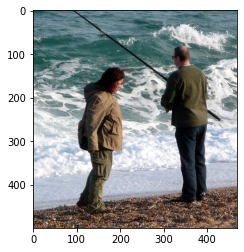

start man in red shirt is standing on the edge of the water end
1/1 [==============================] - 0s 29ms/step


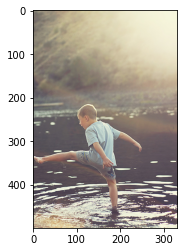

start man in red shirt is walking on the beach end
1/1 [==============================] - 0s 32ms/step


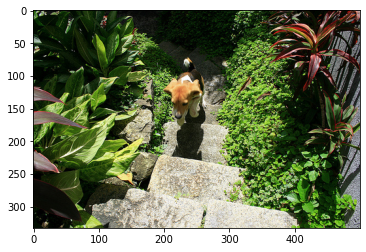

start two children are playing in the grass end
1/1 [==============================] - 0s 42ms/step


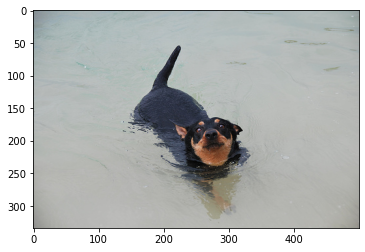

start dog is running through the water end
1/1 [==============================] - 0s 32ms/step


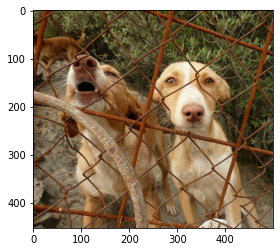

start dog is running through the grass end
1/1 [==============================] - 0s 33ms/step


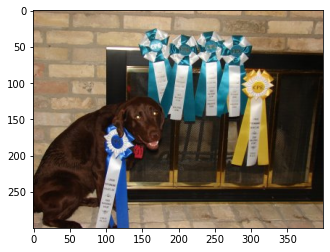

start dog is running through the grass end
1/1 [==============================] - 0s 29ms/step


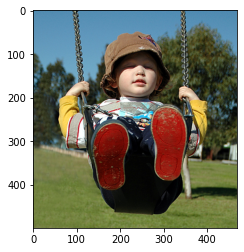

start young boy swings on swing end
1/1 [==============================] - 0s 31ms/step


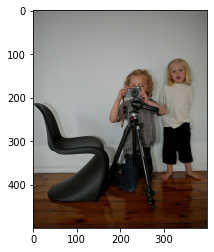

start two children are playing on the grass end
1/1 [==============================] - 0s 29ms/step


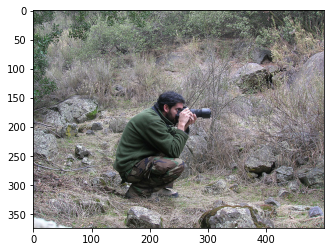

start man in red shirt is climbing rock wall end
1/1 [==============================] - 0s 33ms/step


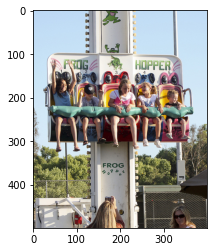

start man in red shirt is standing in front of building end
1/1 [==============================] - 0s 31ms/step


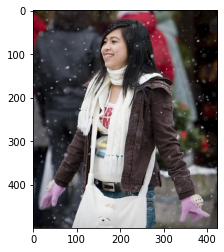

start man in red shirt is standing in front of building end
1/1 [==============================] - 0s 34ms/step


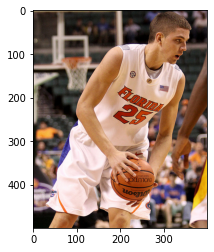

start two men playing softball end
1/1 [==============================] - 0s 30ms/step


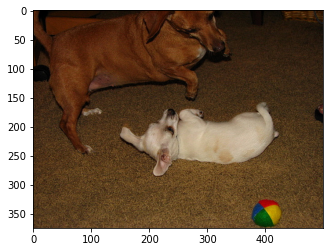

start dog is running through the grass end
1/1 [==============================] - 0s 30ms/step


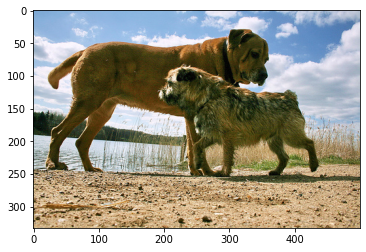

start dog is running through the water end
1/1 [==============================] - 0s 33ms/step


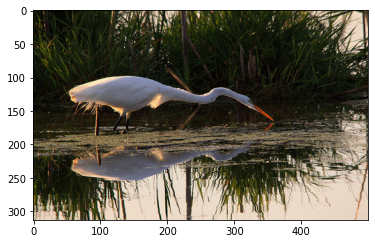

start white bird is flying through the water end
1/1 [==============================] - 0s 33ms/step


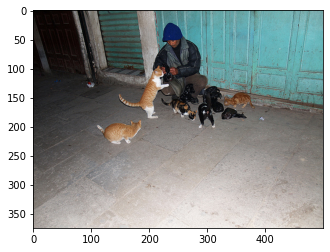

start dog is running through the grass end
1/1 [==============================] - 0s 32ms/step


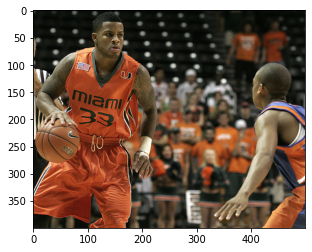

start two men playing softball end
1/1 [==============================] - 0s 28ms/step


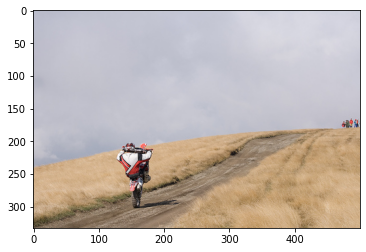

start man on bike is riding through the woods end
1/1 [==============================] - 0s 29ms/step


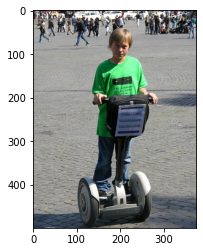

start man in red shirt is riding bike on the street end
1/1 [==============================] - 0s 29ms/step


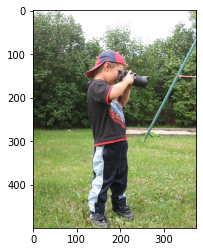

start man in red shirt is standing in front of the sun end
1/1 [==============================] - 0s 29ms/step


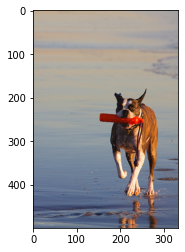

start dog is running through the water end
1/1 [==============================] - 0s 33ms/step


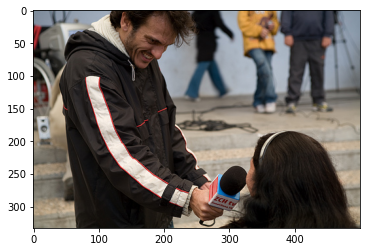

start man in red shirt is standing in front of building end
1/1 [==============================] - 0s 32ms/step


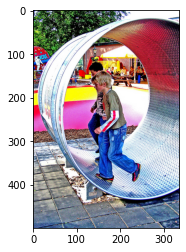

start two children are playing in water end
1/1 [==============================] - 0s 31ms/step


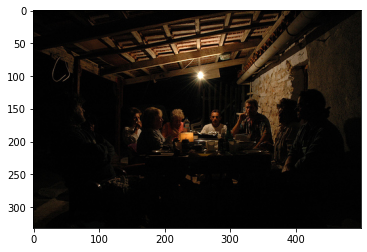

start man in red shirt is standing in front of building end
1/1 [==============================] - 0s 36ms/step


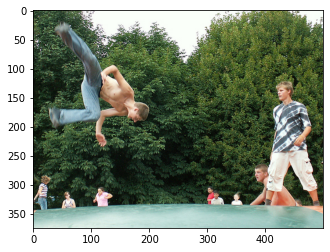

start man in black shorts is walking on the beach end
1/1 [==============================] - 0s 28ms/step


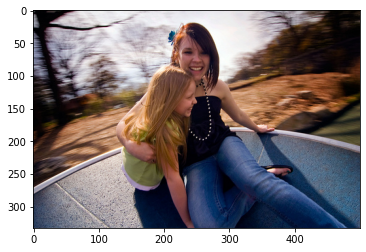

start two girls are sitting on the grass end


In [147]:
filePath = '/content/Flicker8k_Dataset'
for i in range(0,100):
  filename = filePath + '/' + os.listdir(filePath)[i]
  img_feature = extract_features(filename,xception_model)

  img_description = generate_desc(model,tokenizer,img_feature,maxlength)
  image = Image.open(filename)
  plt.imshow(image)
  plt.show()
  print(img_description)